Plot knee plots to check if some samples might contain neutrophils

# Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os, re, gc, joblib

import numpy as np
import numpy_groupies as npg
import scipy.sparse as sp
import pandas as pd
from sklearn.preprocessing import minmax_scale

import matplotlib.pyplot as plt
import seaborn as sn

import anndata

import scanpy as sc
import sctk as sk

/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
# from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import rcParams
from matplotlib.colors import ListedColormap

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42
expr_cmap = sk.expression_colormap()
np.set_printoptions(linewidth=150)
sc.settings.verbosity = 0

%cd ~/scratch/20220125_digestive_tract_integration/v2/

/lustre/scratch117/cellgen/team205/nh3/20220125_digestive_tract_integration/v2


# Load data

In [3]:
MAPPED_DATA_ROOT = "/lustre/scratch117/cellgen/cellgeni/TIC-starsolo"
CB_RERUN_ROOT = "h5ad/cellbender"

REMOTE_METADATA_URL = "https://docs.google.com/spreadsheets/d/1U9YrzE3yqSGu6wXL_1HZn4P51ChCXXcOF9SBJ5ubdX4"
REMOTE_METADATA_SHEET_NAME = "sample_metadata_20220811"

LOCAL_METADATA_CSV = "metadata/sample_metadata.csv"

CB_RERUN_SUMMARY_TSV = "metadata/cellbender_rerun_samples.results.tsv"

In [4]:
metadata = pd.read_csv(LOCAL_METADATA_CSV, index_col=0)

In [5]:
healthy_metadata = metadata[metadata.include_150722 == "healthy_reference"]
disease_metadata = metadata[metadata.include_150722 == "disease"]

In [6]:
healthy_metadata.head(2)

,Order,sampleID,sourceID,donorID_original,study,donorID_corrected,donorID_unified,donor_category,donor_disease,organ_original,...,sample_category,sample_retrieval,tissue_fraction,cell_fraction,cell_fraction_unified,cell_sorting,technology,include_150722,starsolo_out,cellbender_out
0,1,GSM4600896,GSM4600898,Healthy 1,Caetano2021,patient33,D61,control,control,gingival mucosa,...,Non_pathological,Surgery,Mucosa,Live_FACS,Live_FACS,FACS,10X_3pv3,healthy_reference,tic-1168/Cellbender_in/GSM4600896/output,tic-1168/Cellbender_out/GSM4600896.cellbender....
1,2,GSM4600897,GSM4600898,Healthy 2,Caetano2021,patient38,D62,control,control,gingival mucosa,...,Non_pathological,Surgery,Mucosa,Live_FACS,Live_FACS,FACS,10X_3pv3,healthy_reference,tic-1168/Cellbender_in/GSM4600897/output,tic-1168/Cellbender_out/GSM4600897.cellbender....


# Make knee plots

In [84]:
N = healthy_metadata.shape[0]

In [85]:
%%capture

nc = 5
nr = int(np.ceil(N / nc))

sk.set_figsize((3 * nc, 3 * nr))

fig, axs = plt.subplots(
    nrows=nr,
    ncols=nc,
    sharex=True,
    sharey=True,
    gridspec_kw={"wspace": 0.2, "hspace": 0.2},
)

for idx, row in healthy_metadata.iloc[0:N, :].iterrows():
    i = idx // nc
    j = idx - i * nc

    sid = row.sample_id

    umi_per_cell_txt = (
        f"{MAPPED_DATA_ROOT}/{row.starsolo_out}/GeneFull/UMIperCellSorted.txt"
    )
    umi_per_cell = np.array(sk.read_list(umi_per_cell_txt))

    ax = axs[i, j]
    ax.plot(np.arange(umi_per_cell.size) + 1, umi_per_cell, "-", c="k")
    ax.axhline(y=50, linewidth=0.5, c="k")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(sid)

In [86]:
fig.savefig("qc_plot/knee_plots.png", bbox_inches="tight")

In [91]:
fig.savefig("qc_plot/knee_plots.pdf", bbox_inches="tight")

In [92]:
gc.collect()

6136

## code below discarded as being too slow

# Check a few sets of samples

## Function

In [4]:
def check_sample(ad, threshold=50):
    neut_markers = [
        "LTF",
        "CD24",
        "S100A8",
        "S100A9",
        "S100A12",
        "PROK2",
        "CR1",
        "MMP9",
        "FCGR3B",
    ]
    ad1 = ad[ad.obs.n_counts >= threshold].copy()
    sk.calculate_qc(ad1)
    ad2 = sk.simple_default_pipeline(ad1, post_filter_only=True)
    sk.LR_predict(
        ad2, "model/martin19_all.lognorm.pkl", key_added="martin19_annot", min_prob=0.3
    )
    sc.tl.score_genes(ad2, neut_markers, score_name="neut_signature")

    sk.plot_embedding(ad2, groupby="martin19_annot", annot="full", figsize=(6, 6))

    sk.set_figsize((4, 4))
    sc.pl.umap(ad2, color="martin19_annot_prob")

    sk.set_figsize((4, 4))
    sc.pl.umap(
        ad2,
        color=[
            "log1p_n_counts",
            "log1p_n_genes",
            "percent_mito",
            "percent_ribo",
            "percent_hb",
            "percent_top50",
        ],
        ncols=6,
    )

    sk.plot_genes(
        ad2,
        genes=neut_markers,
        vmin=0,
        vmax=1,
    )

    sk.set_figsize((4, 4))
    sc.pl.umap(ad2, color="neut_signature")
    ax = sc.pl.scatter(ad2, "n_counts", "neut_signature", show=False)
    ax.set_xscale("log")

    return ad2

## "Multi-knee" samples

In [8]:
possible_samples = (
    "GSM4850590",
    "GSM3972014",
    "Human_colon_16S8123919",
    "Human_colon_16S7985394",
)

In [9]:
raw_ads = {}
ads = {}

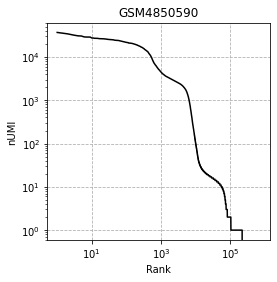

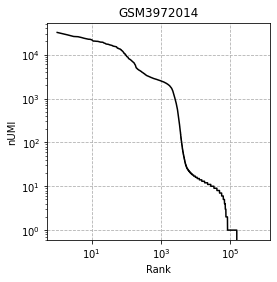

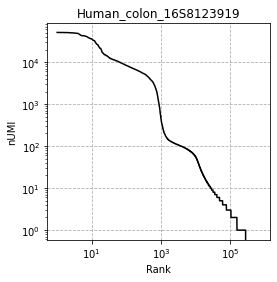

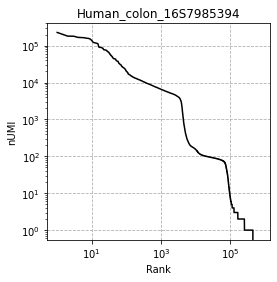

In [10]:
for sid in possible_samples:
    mtx = f"{MAPPED_DATA_ROOT}/{healthy_metadata.loc[healthy_metadata.sample_id == sid, 'starsolo_out'].values[0]}/GeneFull/raw"
    raw_ads[sid] = sc.read_10x_mtx(mtx)
    sk.set_figsize((4, 4))
    sk.plot_metric_by_rank(raw_ads[sid], swap_axis=True, title=sid);

In [11]:
thresholds = {
    "GSM4850590": 50,
    "GSM3972014": 50,
    "Human_colon_16S8123919": 100,
    "Human_colon_16S7985394": 100,
}

GSM4850590


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


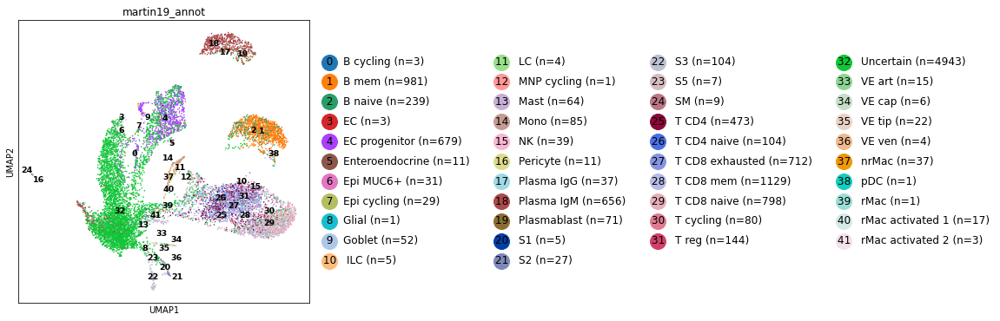

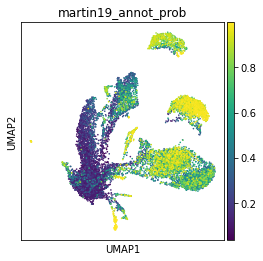

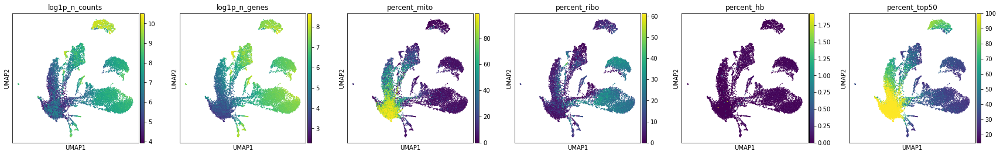

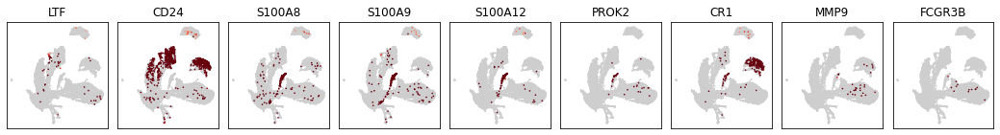

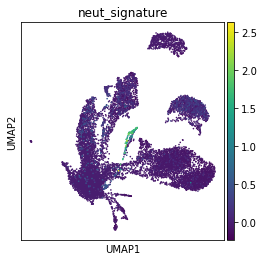

GSM3972014


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


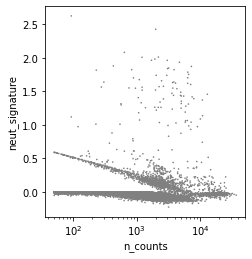

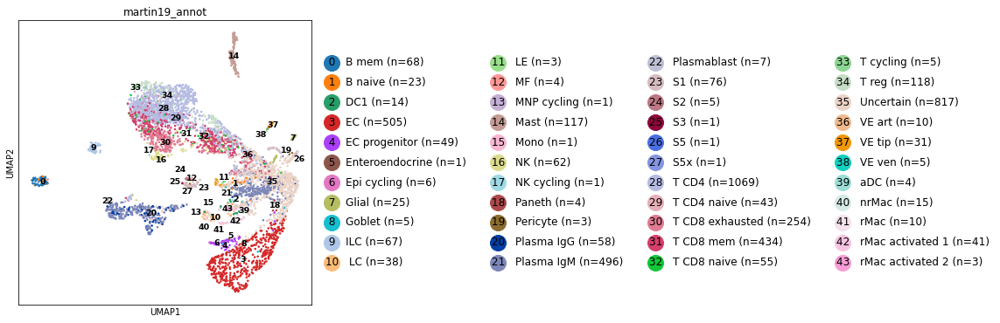

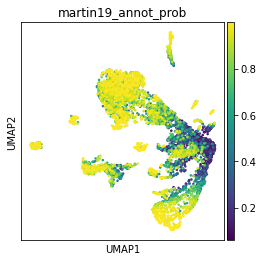

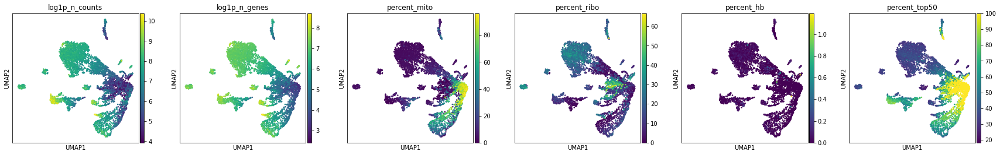

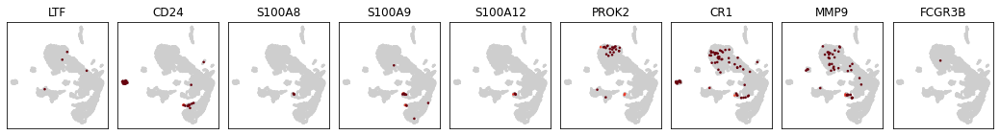

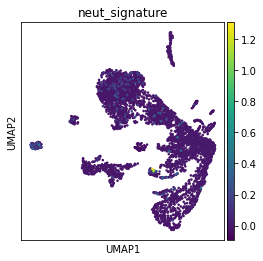

Human_colon_16S8123919


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


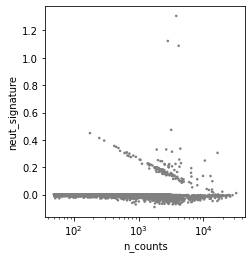

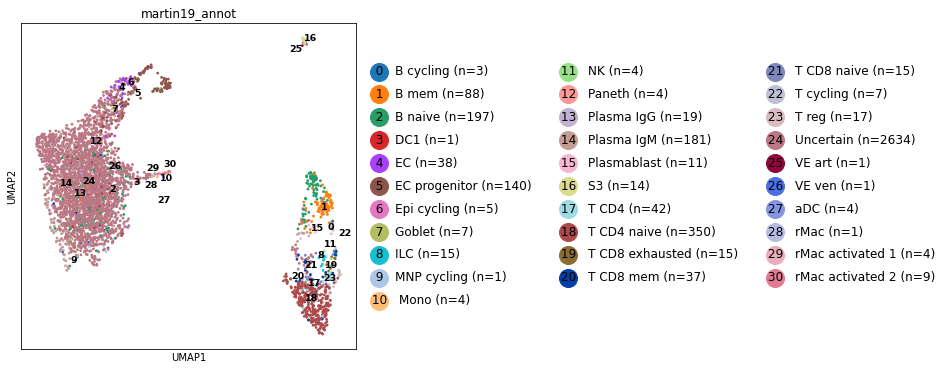

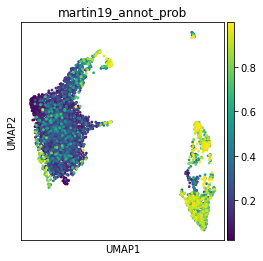

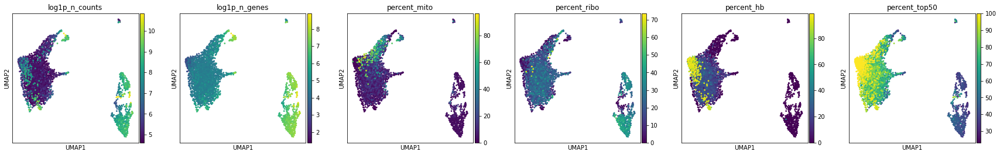

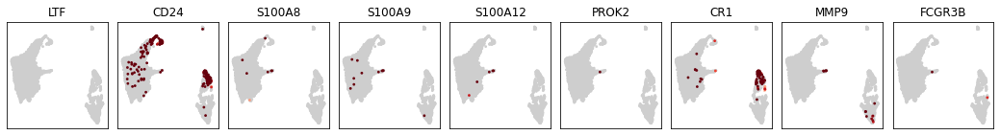

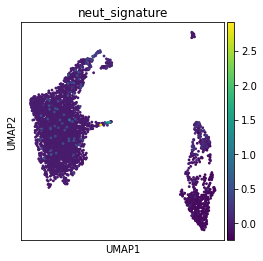

Human_colon_16S7985394


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


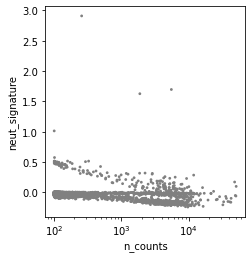

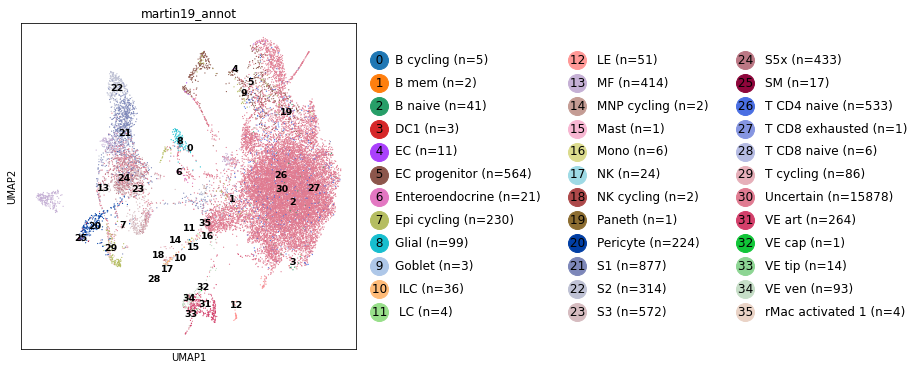

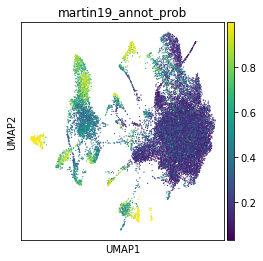

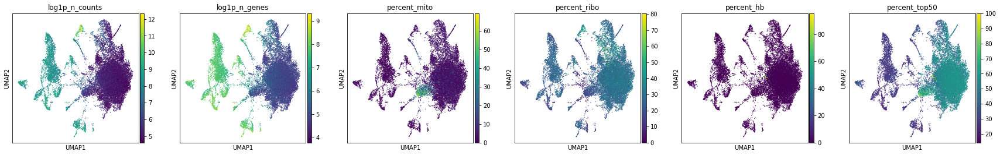

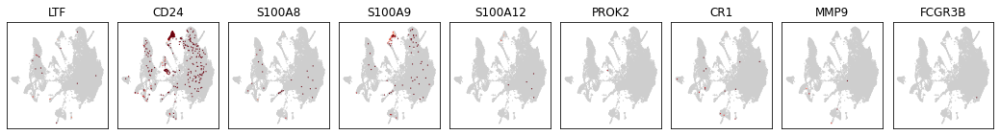

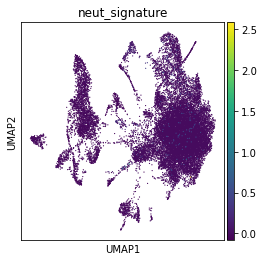

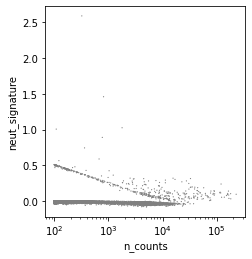

In [14]:
for sid in possible_samples:
    print(sid)
    ads[sid] = check_sample(raw_ads[sid], thresholds[sid])

GSM4850590
GSM3972014
Human_colon_16S8123919
Human_colon_16S7985394


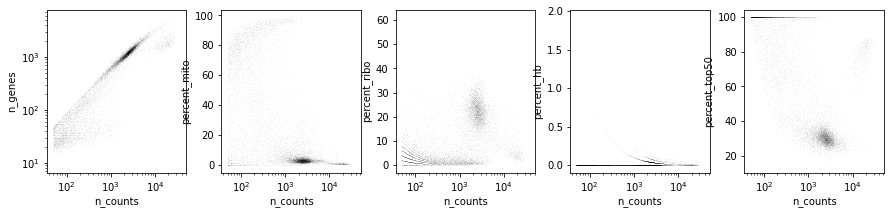

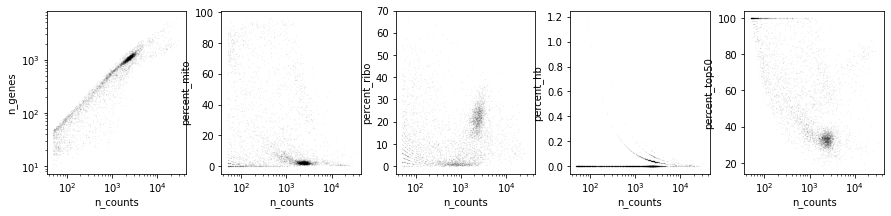

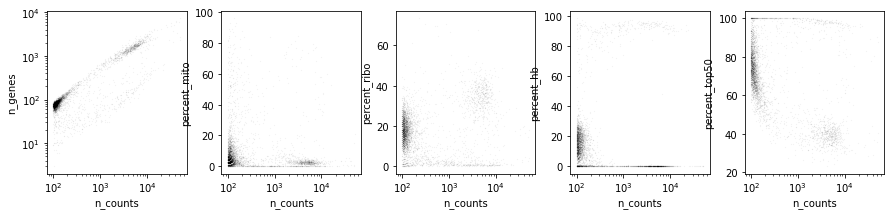

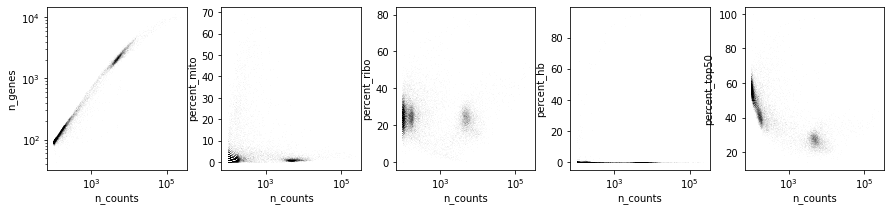

In [15]:
for sid in possible_samples:
    print(sid)
    sk.plot_qc_scatter(
        ads[sid],
        metric_pairs=(
            ("log1p_n_counts", "log1p_n_genes"),
            ("log1p_n_counts", "percent_mito"),
            ("log1p_n_counts", "percent_ribo"),
            ("log1p_n_counts", "percent_hb"),
            ("log1p_n_counts", "percent_top50"),
        ),
    )

In [3]:
ad = sc.read("../h5ad/post_qc/GSM4850590.gene_velo_cellbender.post_qc.h5ad")

## Additional samples

In [16]:
sid = "4918STDY7693757"

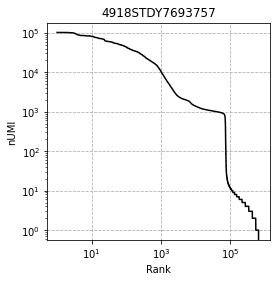

In [17]:
mtx = f"{MAPPED_DATA_ROOT}/{healthy_metadata.loc[healthy_metadata.sample_id == sid, 'starsolo_out'].values[0]}/GeneFull/raw"
raw_ads[sid] = sc.read_10x_mtx(mtx)
sk.set_figsize((4, 4))
sk.plot_metric_by_rank(raw_ads[sid], swap_axis=True, title=sid);

In [18]:
thresholds[sid] = 500

/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


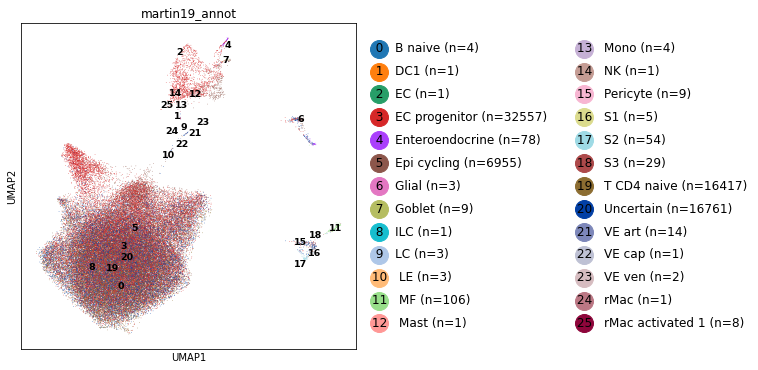

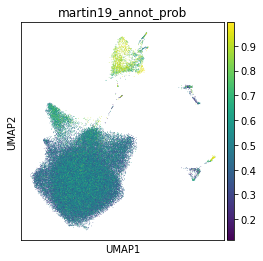

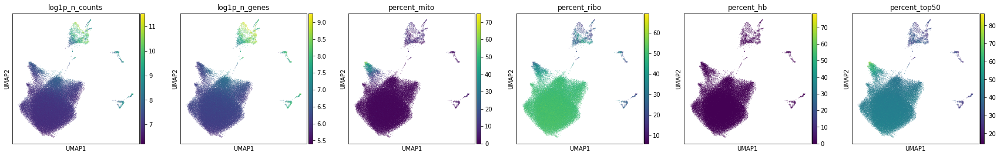

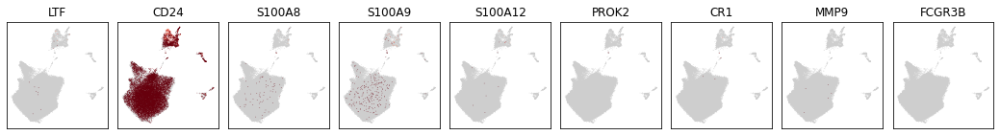

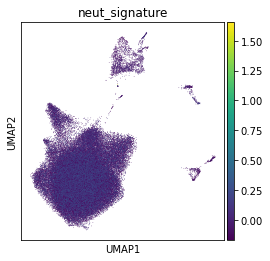

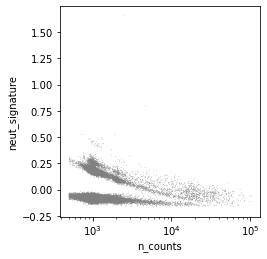

In [19]:
ads[sid] = check_sample(raw_ads[sid], thresholds[sid])

In [ ]:
print(sid)
sk.plot_qc_scatter(
    ads[sid],
    metric_pairs=(
        ("log1p_n_counts", "log1p_n_genes"),
        ("log1p_n_counts", "percent_mito"),
        ("log1p_n_counts", "percent_ribo"),
        ("log1p_n_counts", "percent_hb"),
        ("log1p_n_counts", "percent_top50"),
    ),
)

## Positive control samples

In [5]:
pos_samples = ("HCA_A_GT12934997", "HCA_A_GT12934998", "HCA_A_GT12934999")

In [6]:
raw_ads = {}
ads = {}

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


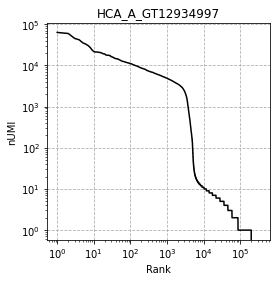

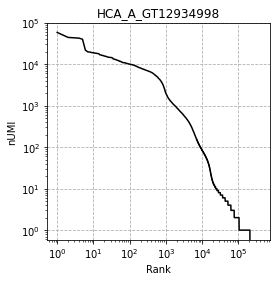

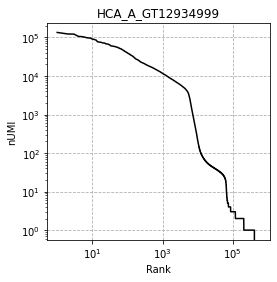

In [7]:
for sid in pos_samples:
    h5 = f"CBTM/{sid}.raw_feature_bc_matrix.h5"
    raw_ads[sid] = sc.read_10x_h5(h5)
    raw_ads[sid].var_names_make_unique()
    sk.set_figsize((4, 4))
    sk.plot_metric_by_rank(raw_ads[sid], swap_axis=True, title=sid);

### Stringent threshold at 1000

In [8]:
thresholds = {
    "HCA_A_GT12934997": 1000,
    "HCA_A_GT12934998": 1000,
    "HCA_A_GT12934999": 1000,
}

HCA_A_GT12934997


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


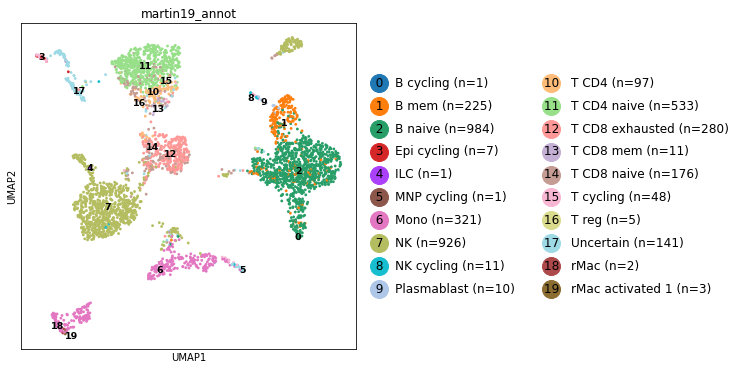

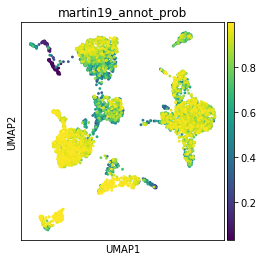

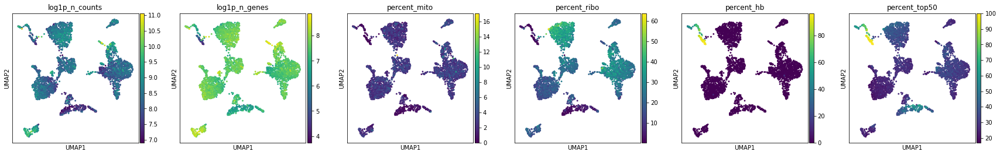

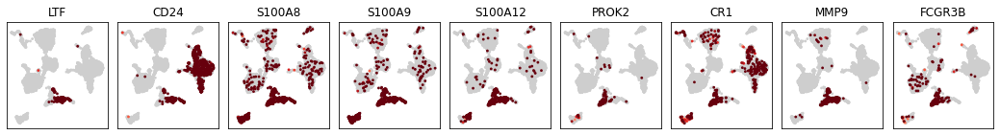

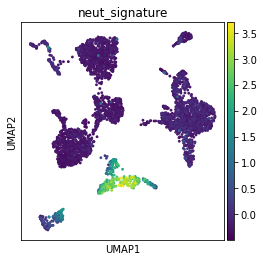

HCA_A_GT12934998


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


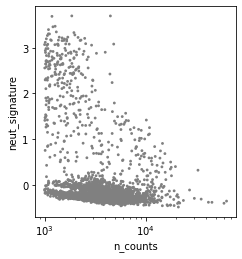

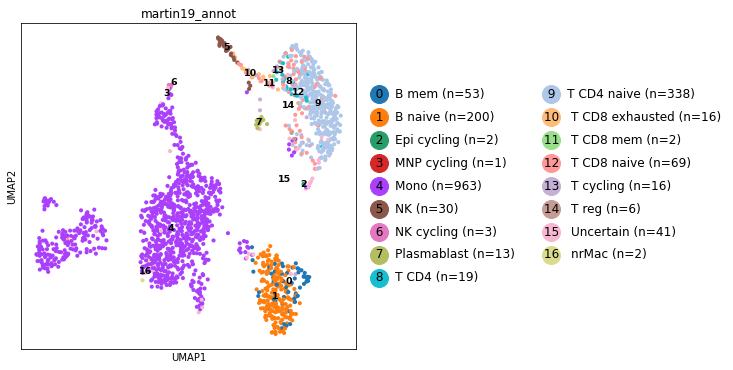

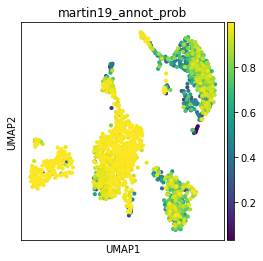

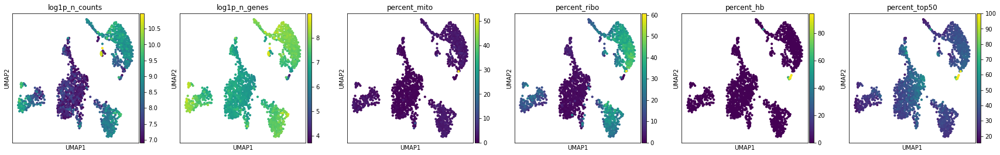

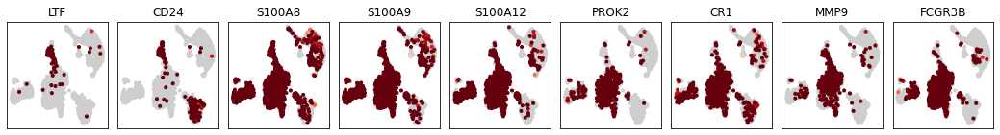

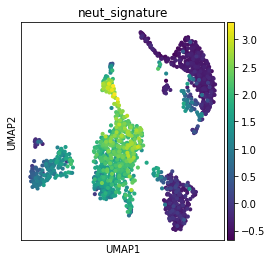

HCA_A_GT12934999


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


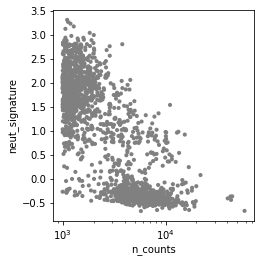

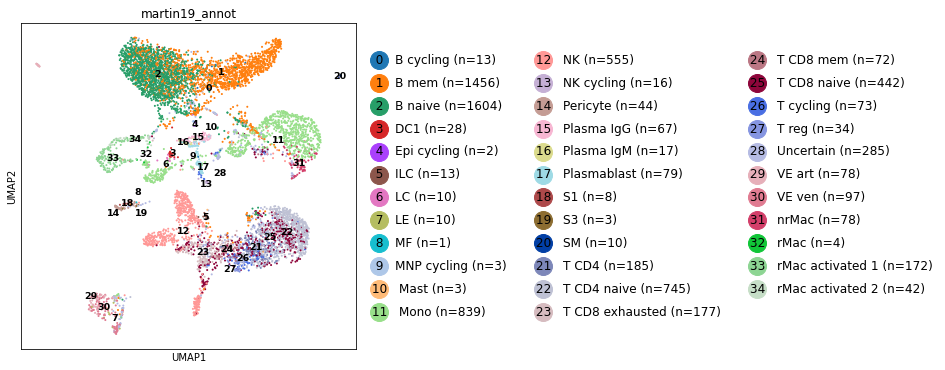

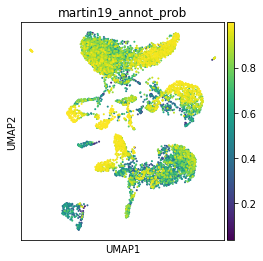

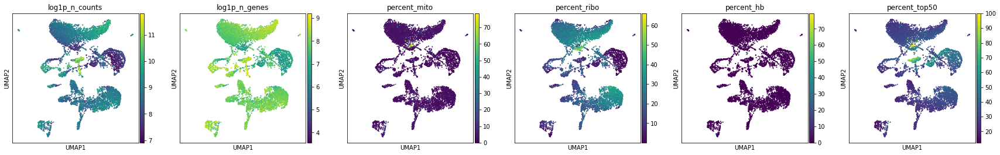

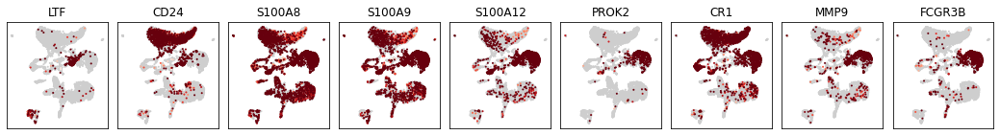

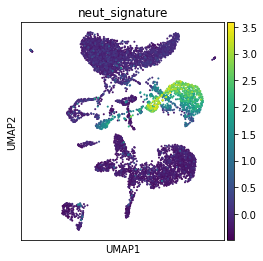

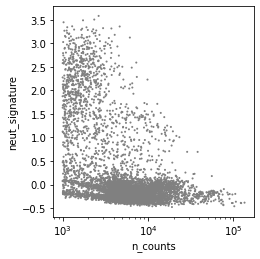

In [10]:
for sid in pos_samples:
    print(sid)
    ads[sid] = check_sample(raw_ads[sid], threshold=thresholds[sid])

### Relaxed threshold at 250

In [11]:
thresholds = {
    "HCA_A_GT12934997": 250,
    "HCA_A_GT12934998": 250,
    "HCA_A_GT12934999": 250,
}

HCA_A_GT12934997


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


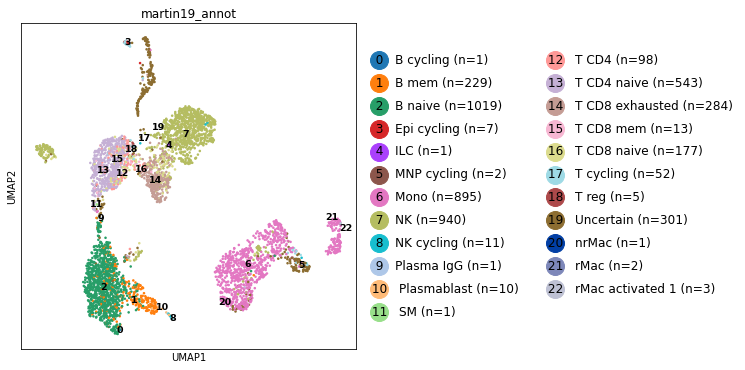

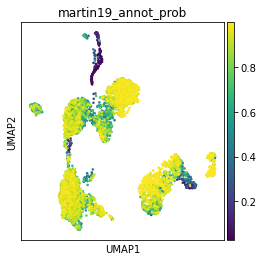

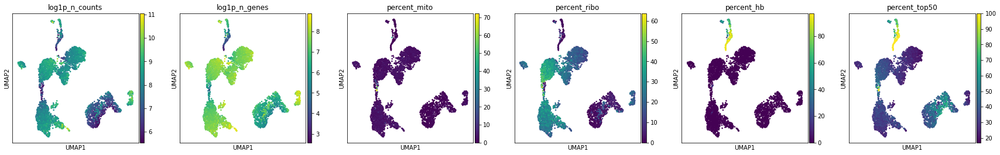

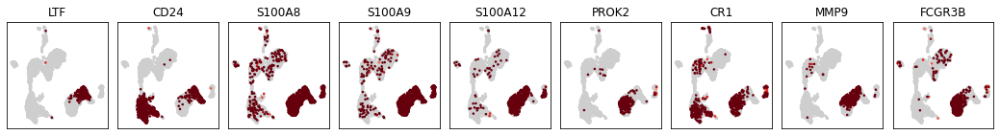

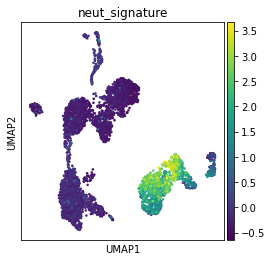

HCA_A_GT12934998


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


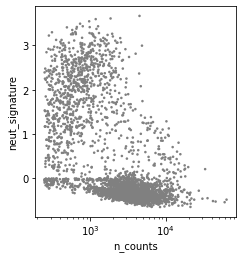

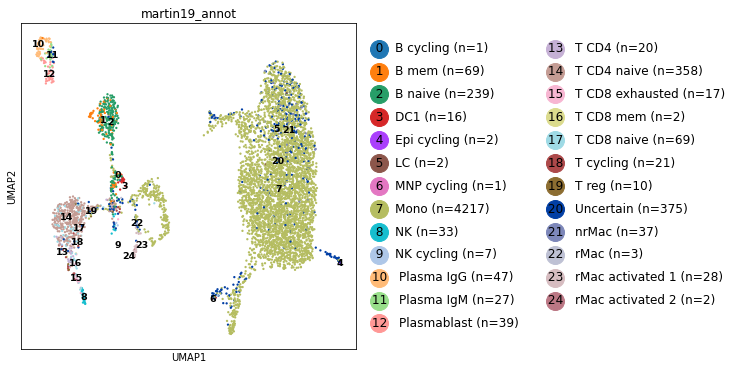

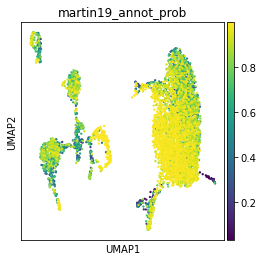

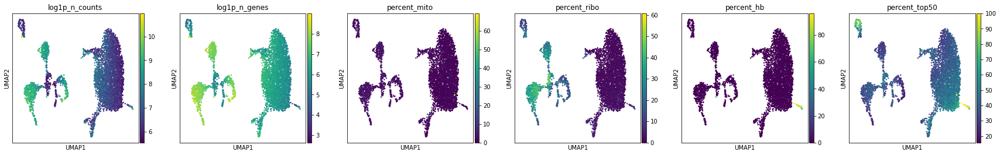

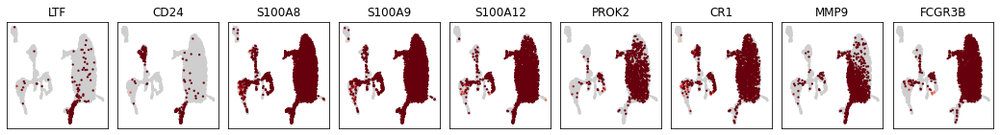

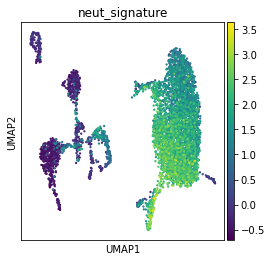

HCA_A_GT12934999


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


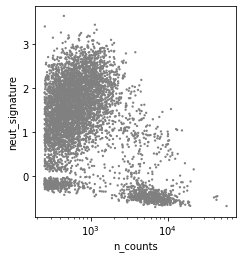

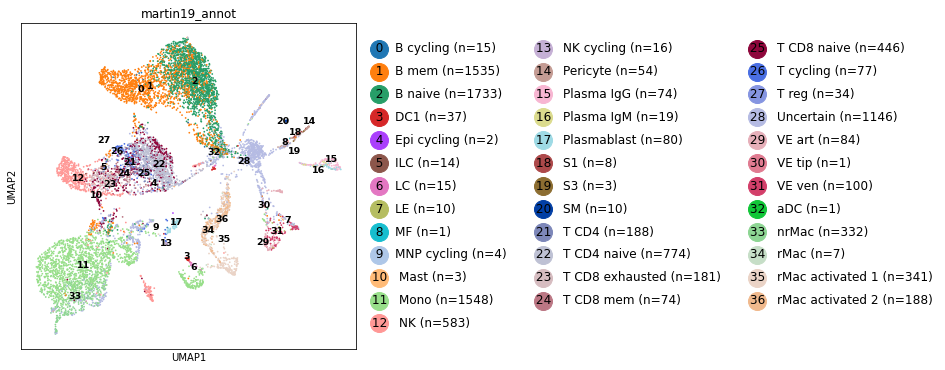

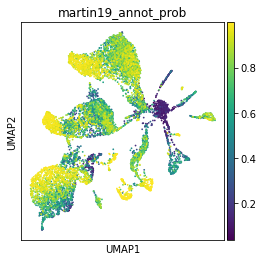

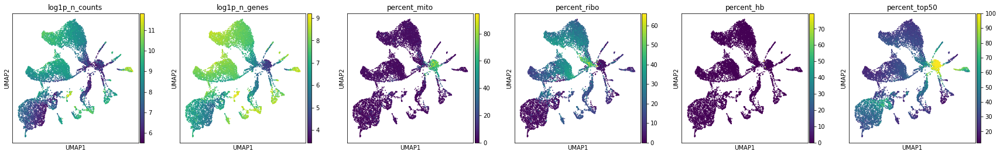

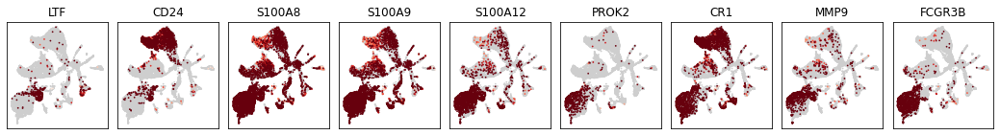

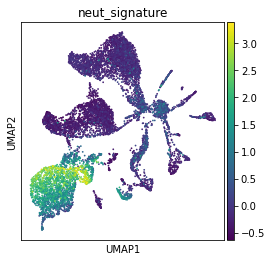

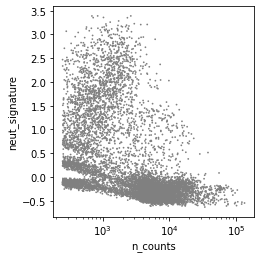

In [12]:
for sid in pos_samples:
    print(sid)
    ads[sid] = check_sample(raw_ads[sid], threshold=thresholds[sid])

HCA_A_GT12934997
HCA_A_GT12934998
HCA_A_GT12934999


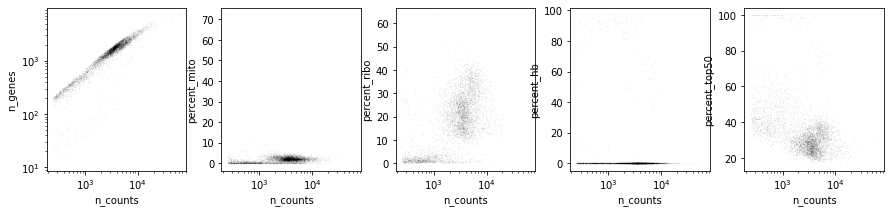

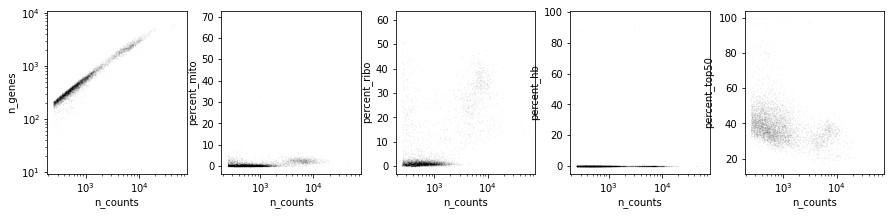

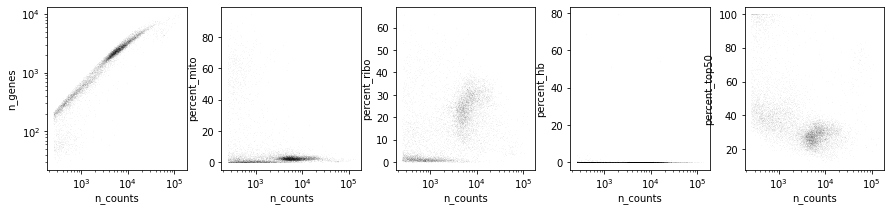

In [14]:
for sid in pos_samples:
    print(sid)
    sk.plot_qc_scatter(
        ads[sid],
        metric_pairs=(
            ("log1p_n_counts", "log1p_n_genes"),
            ("log1p_n_counts", "percent_mito"),
            ("log1p_n_counts", "percent_ribo"),
            ("log1p_n_counts", "percent_hb"),
            ("log1p_n_counts", "percent_top50"),
        ),
    )

## Questionable samples

In [15]:
ques_samples = (
    "HCA_A_GT12935004",
    "HCA_A_GT12935005",
    "HCA_A_GT12935006",
    "HCA_A_GT12935007",
)

In [16]:
fltd_ads = {}

In [ ]:
for sid in ques_samples:
    raw_h5 = f"CBTM/{sid}.raw_feature_bc_matrix.h5"
    fltd_h5 = f"CBTM/{sid}.filtered_feature_bc_matrix.h5"
    raw_ads[sid] = sc.read_10x_h5(raw_h5)
    raw_ads[sid].var_names_make_unique()
    fltd_ads[sid] = sc.read_10x_h5(fltd_h5)
    fltd_ads[sid].var_names_make_unique()
    sk.set_figsize((4, 4))
    sk.plot_metric_by_rank(raw_ads[sid], swap_axis=True, title=sid);

## Martin19 samples

In [26]:
martin_samples = healthy_metadata.loc[
    healthy_metadata.study == "Martin2019", "sample_id"
].tolist()

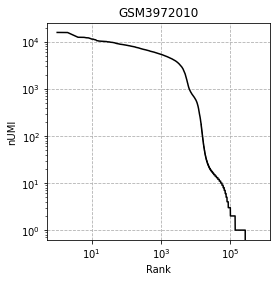

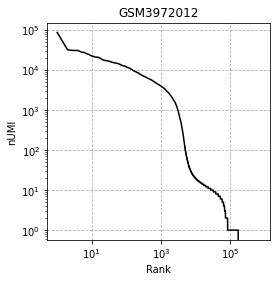

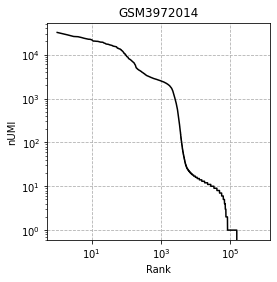

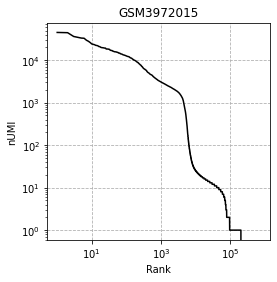

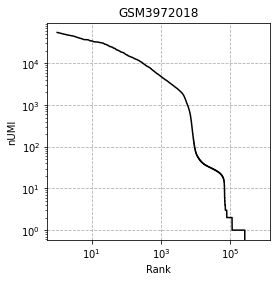

...

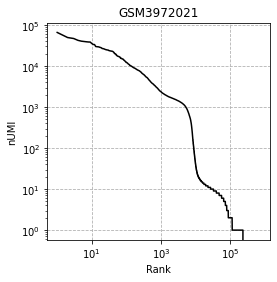

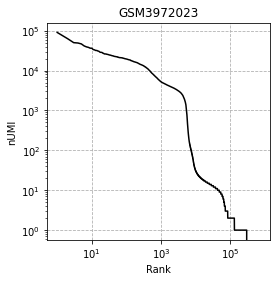

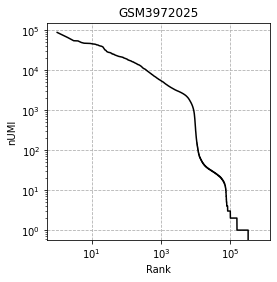

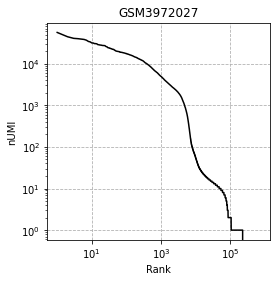

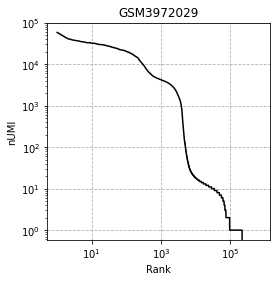

In [27]:
for sid in martin_samplesmartin_samples  mtx = f"{MAPPED_DATA_ROOT}/{healthy_metadata.loc[healthy_metadata.sample_id == sid, 'starsolo_out'].values[0]}/GeneFull/raw"
    raw_ads[sid] = sc.read_10x_mtx(mtx)
    sk.set_figsize((4, 4))
    sk.plot_metric_by_rank(raw_ads[sid], swap_axis=True, title=sid);

In [28]:
thresholds = {sid: 250 for sid in martin_samples}

GSM3972010


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


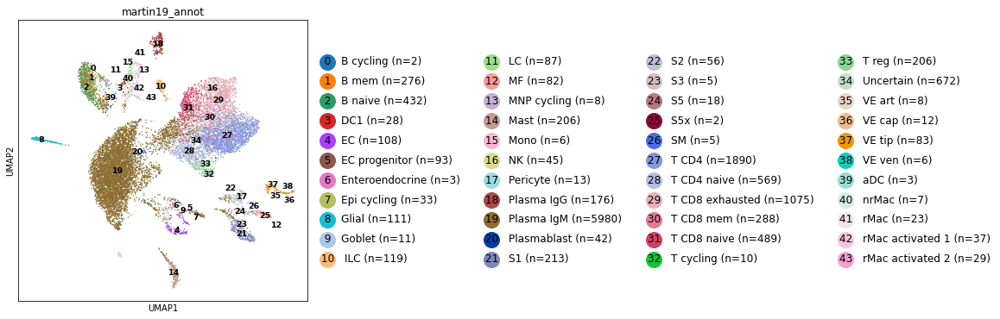

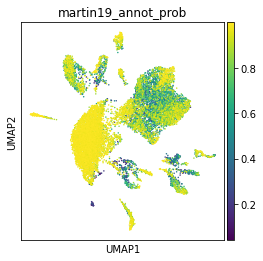

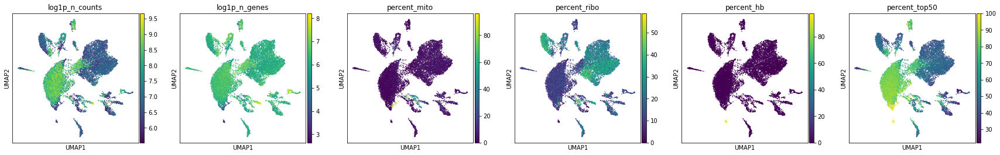

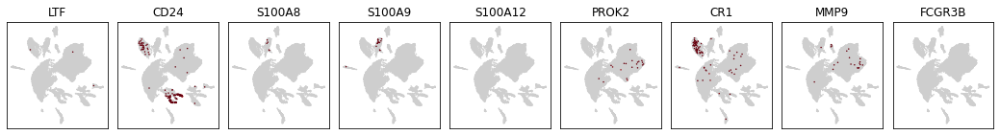

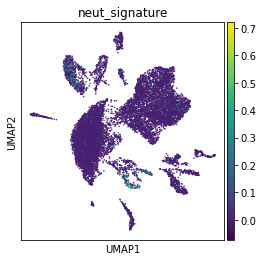

GSM3972012


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


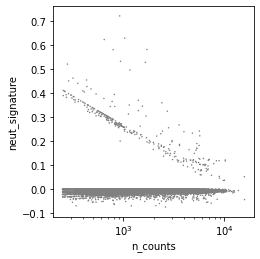

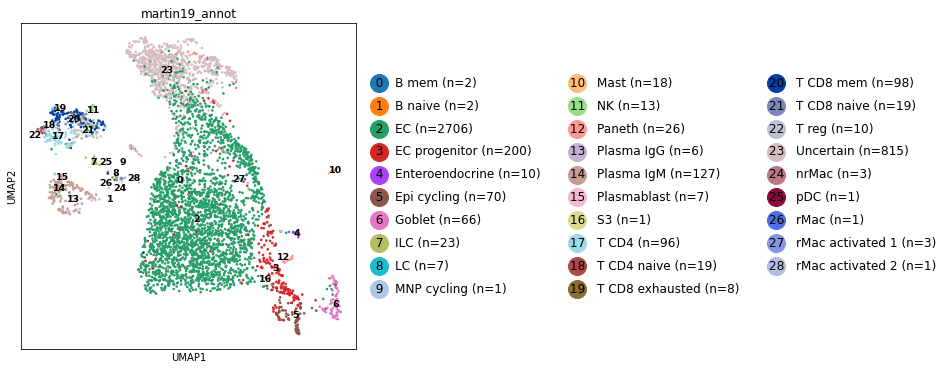

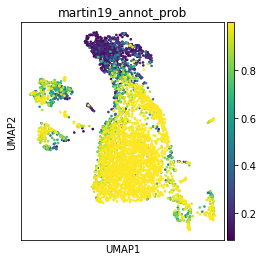

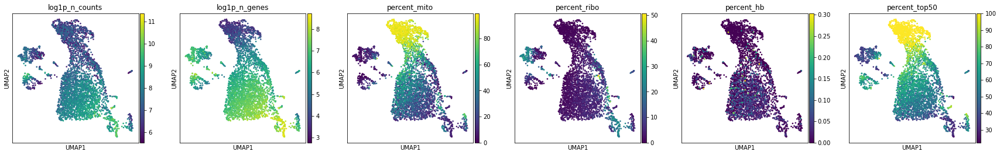

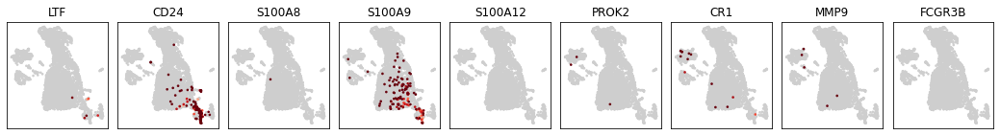

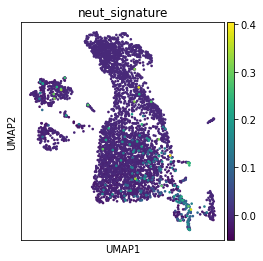

GSM3972014


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


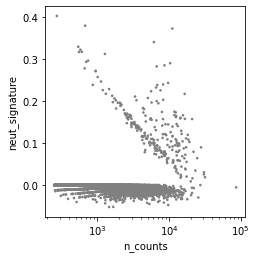

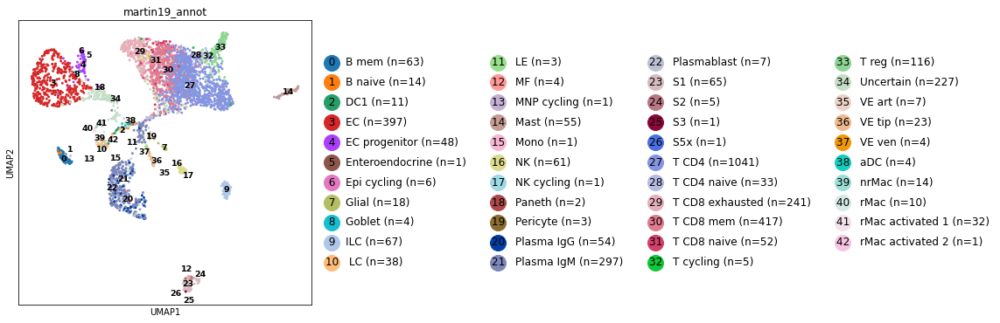

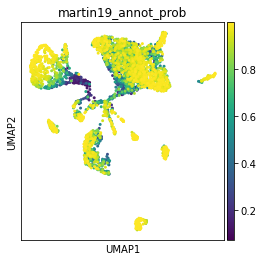

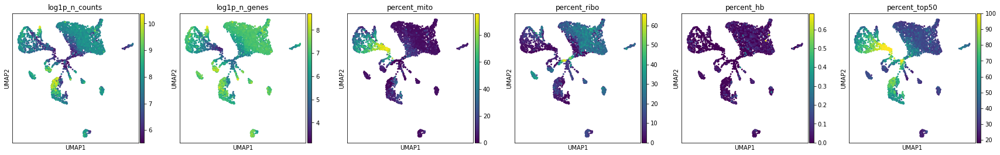

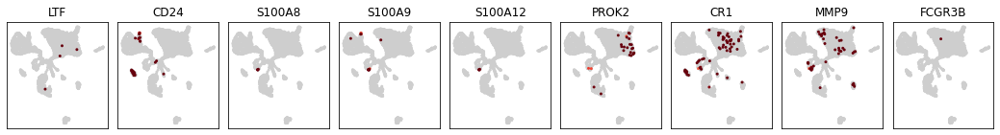

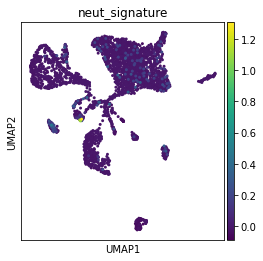

GSM3972015


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


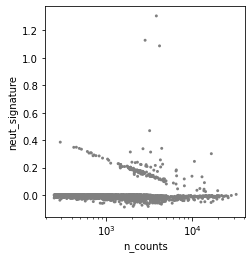

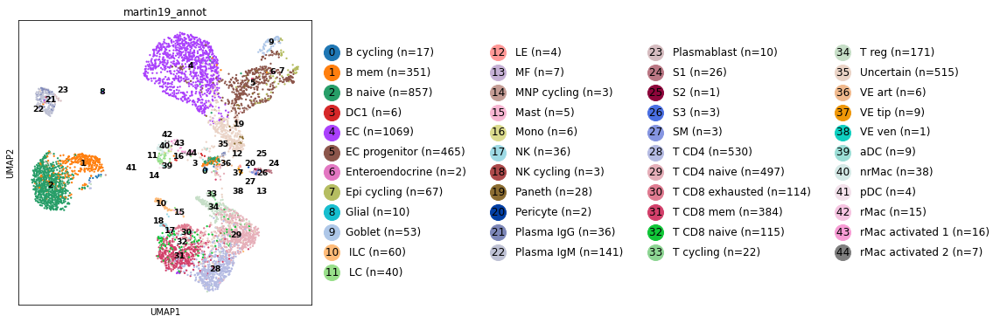

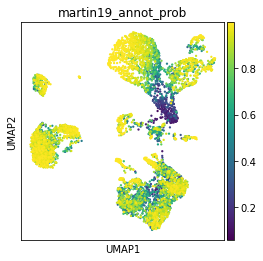

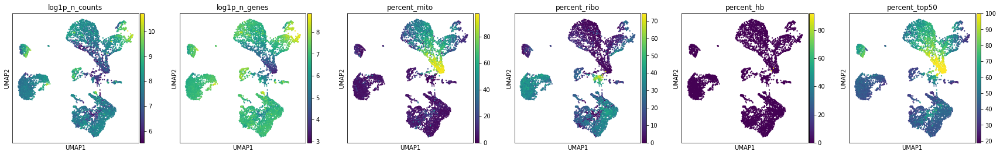

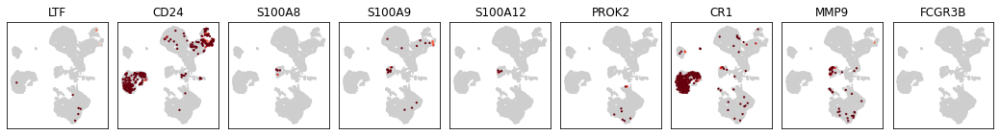

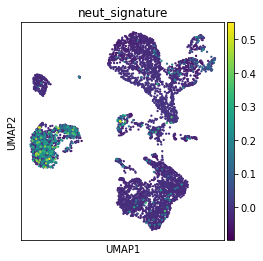

GSM3972018


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


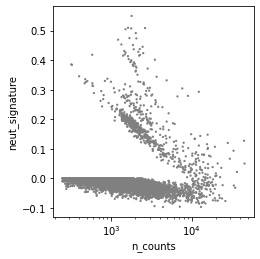

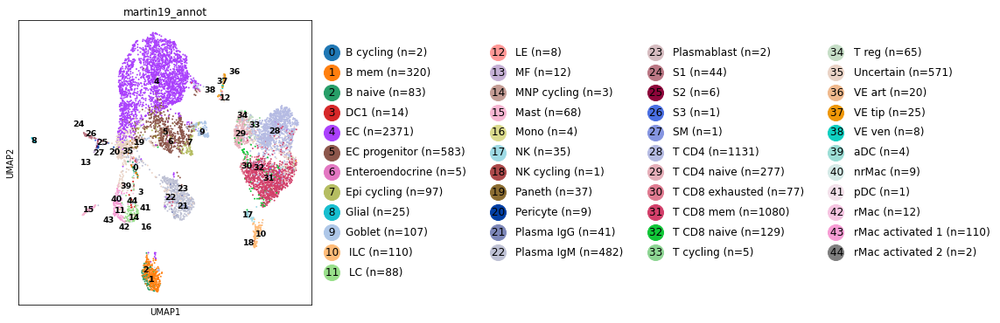

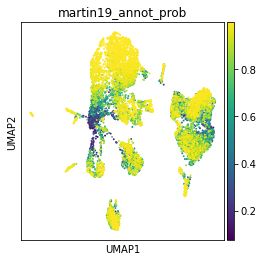

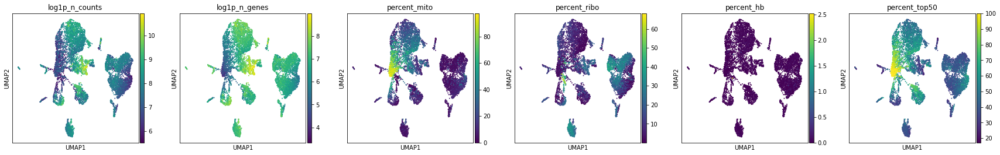

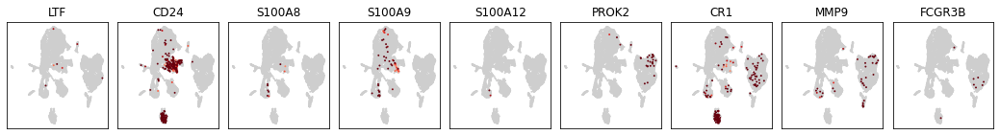

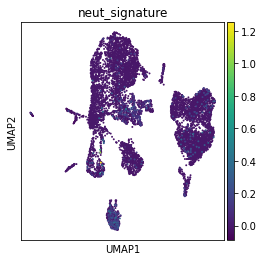

GSM3972019


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


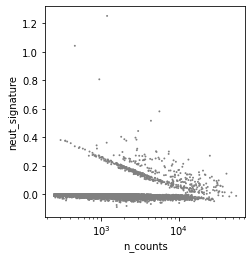

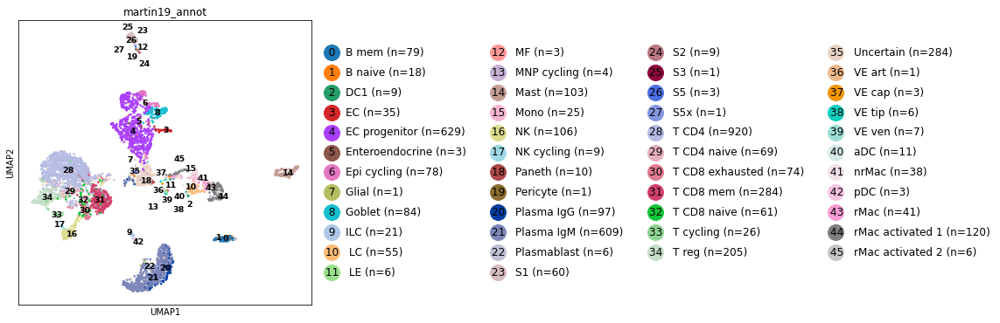

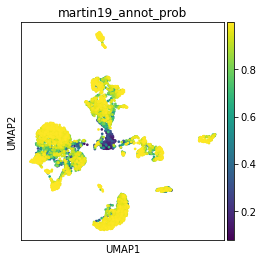

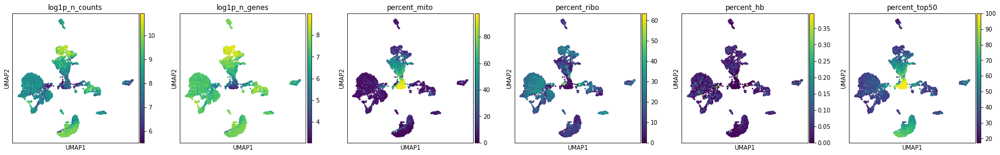

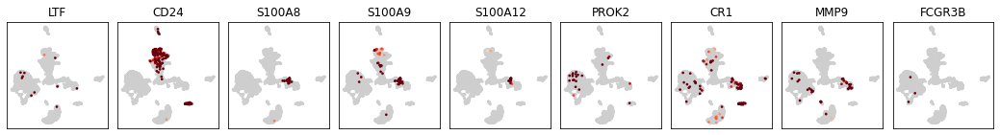

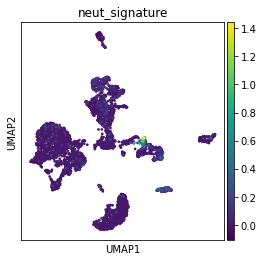

GSM3972021


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


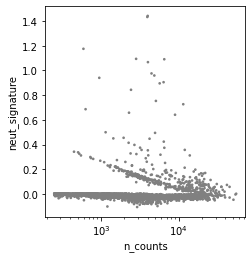

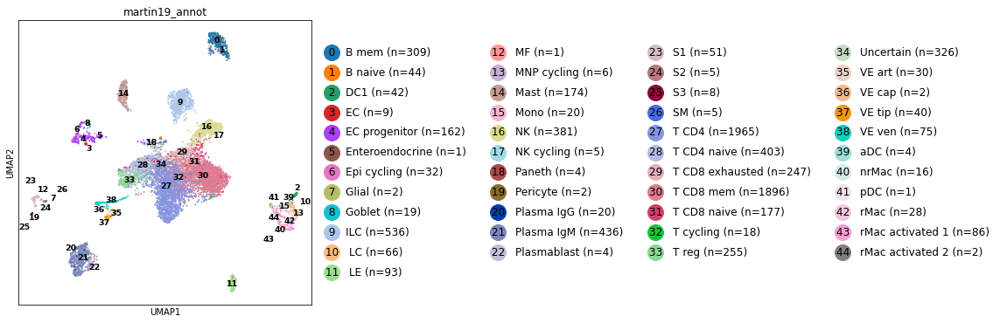

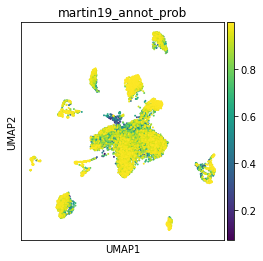

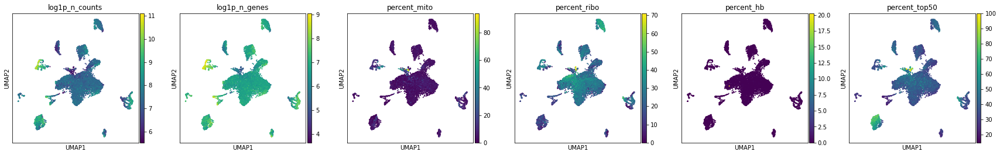

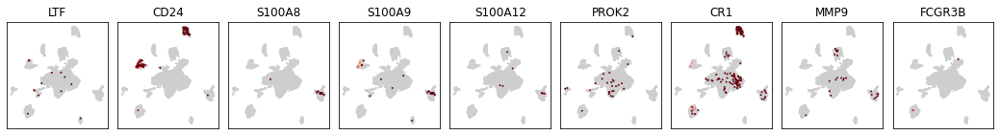

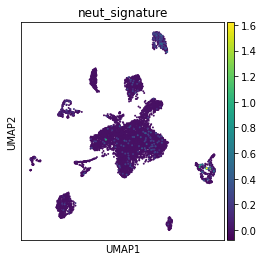

GSM3972023


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


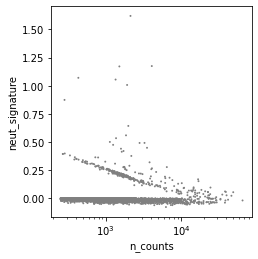

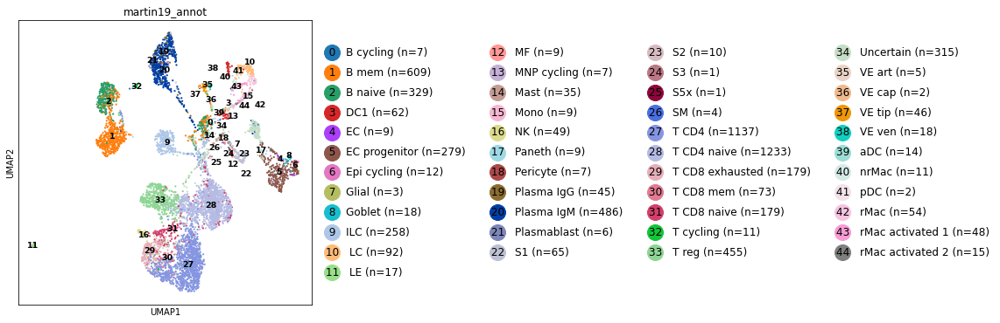

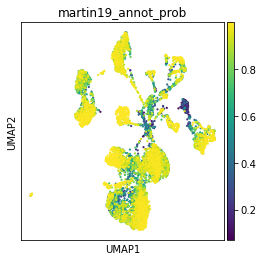

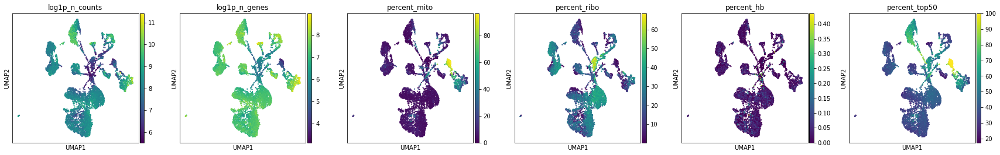

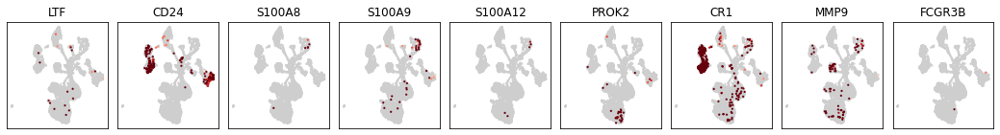

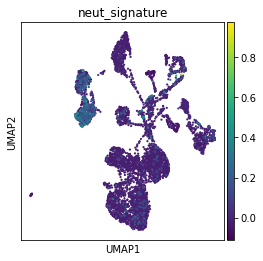

GSM3972025


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


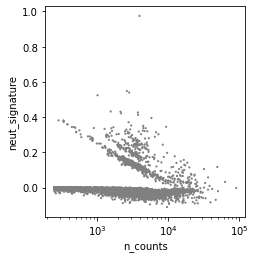

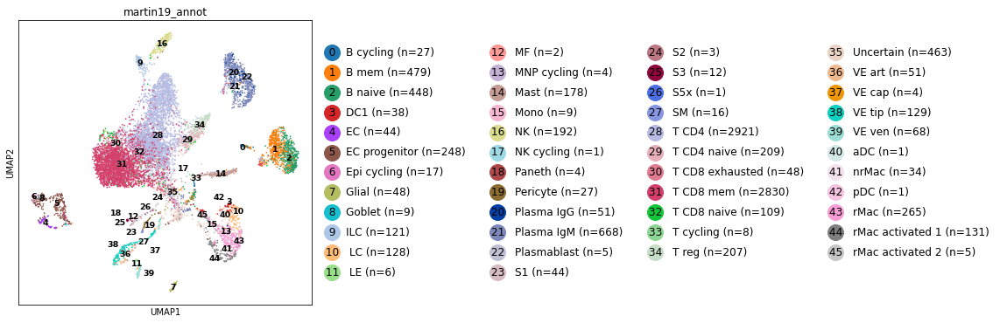

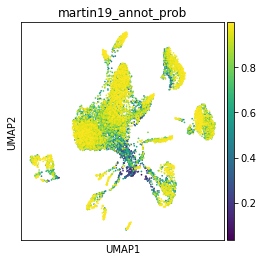

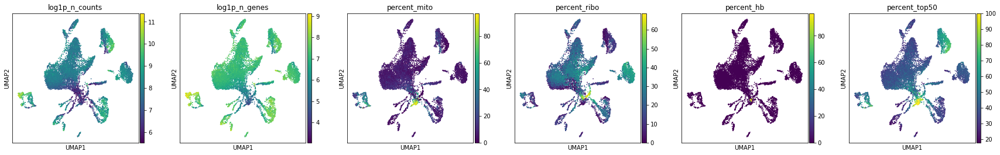

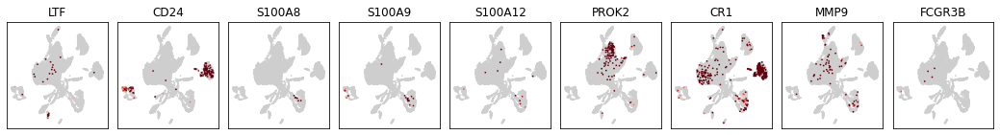

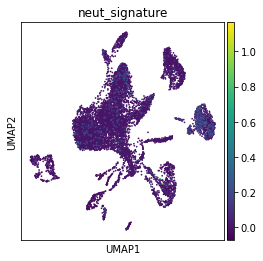

GSM3972027


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


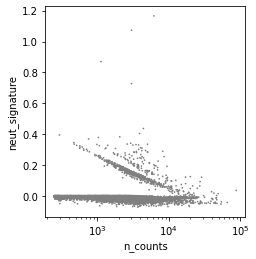

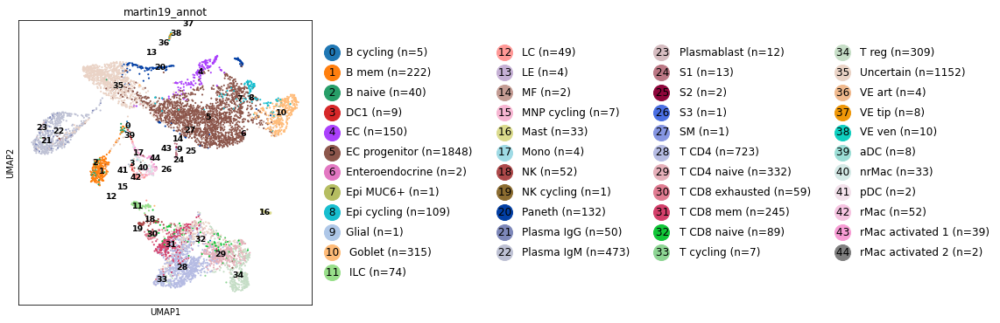

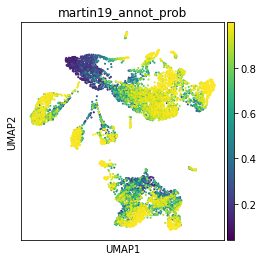

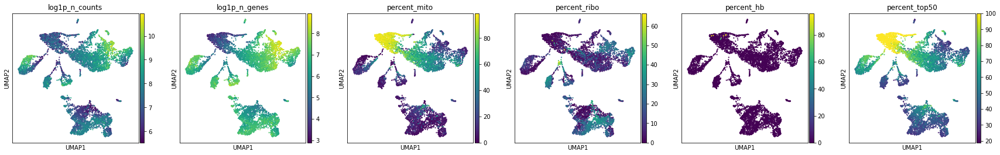

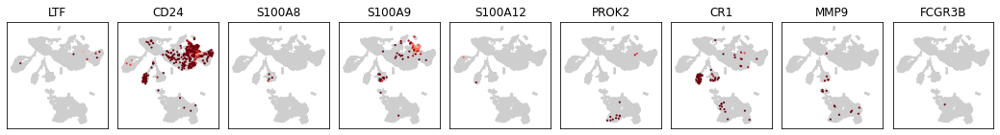

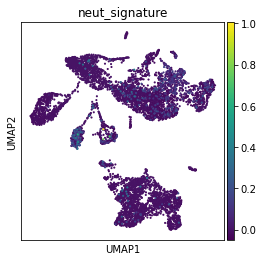

GSM3972029


/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator LogisticRegression from version 0.23.1 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(
21934 features used for prediction
... storing 'feature_types' as categorical
/nfs/team205/nh3/miniconda2/envs/scanpy-new/lib/python3.8/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


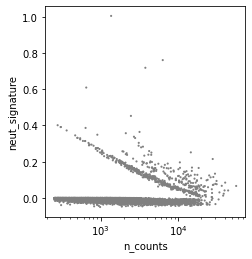

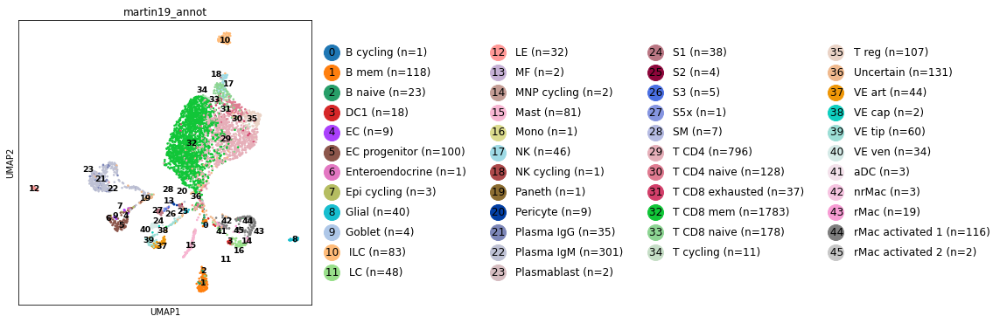

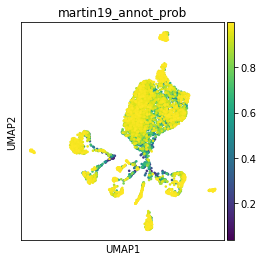

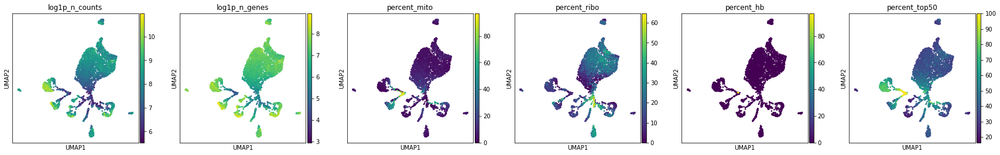

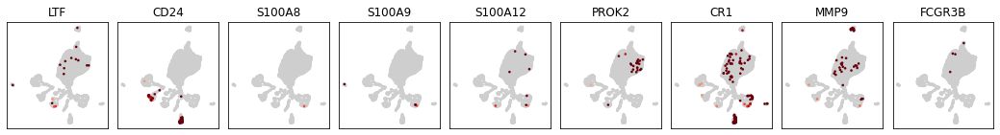

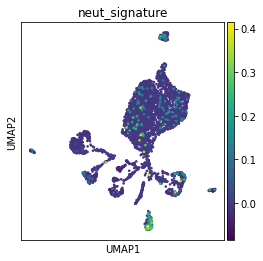

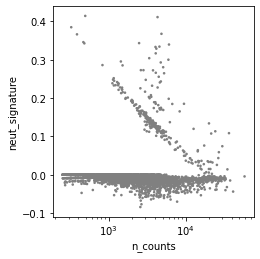

In [29]:
for sid in martin_samples:
    print(sid)
    ads[sid] = check_sample(raw_ads[sid], thresholds[sid])

# Check cell type prediction for all samples

In [15]:
obs = sk.read_h5ad(
    "h5ad/pooled/pooled_healthy.gene_cellbender.post_qc.20220909.h5ad", component="obs"
)

In [16]:
obs.columns

Index(['latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH',
       'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL',
       'cecilia22_predL_prob', 'cecilia22_predL_uncertain',
       'elmentaite21_pred', 'elmentaite21_pred_prob',
       'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob',
       'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes',
       'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo',
       'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50',
       'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw',
       'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw',
       'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw',
       'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced',
       'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced',
       'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced',
       'n_counts_ribo_spl

In [23]:
obs.suo22_pred.cat.categories.values

array(['ABT(ENTRY)', 'B1', 'CD4+T', 'CD8+T', 'CD8AA', 'CYCLING_B', 'CYCLING_DC', 'CYCLING_EPITHELIUM', 'CYCLING_FIBROBLAST_I',
       'CYCLING_FIBROBLAST_II', 'CYCLING_ILC', 'CYCLING_MPP', 'CYCLING_NK', 'CYCLING_T', 'CYCLING_YS_ERY', 'DC1', 'DC2', 'DEVELOPING_NEPHRON_I',
       'DEVELOPING_NEPHRON_II', 'DOUBLET', 'DOUBLETS_FIBRO_ERY', 'DOUBLET_IMMUNE_FIBROBLAST', 'DOUBLET_LYMPHOID_MACROPHAGE',
       'DOUBLET_VSMC_ERYTHROCYTE', 'DP(Q)_T', 'EARLY_MK', 'ENDOTHELIUM_I', 'ENDOTHELIUM_II', 'ENDOTHELIUM_III', 'ENTEROENDOCRINE_I',
       'ENTEROENDOCRINE_II', 'EOSINOPHIL_BASOPHIL', 'EPITHELIUM_I', 'EPITHELIUM_II', 'FIBROBLAST_I', 'FIBROBLAST_II', 'FIBROBLAST_IV',
       'FIBROBLAST_IX', 'FIBROBLAST_VI', 'FIBROBLAST_VII', 'FIBROBLAST_VIII', 'FIBROBLAST_X', 'FIBROBLAST_XI', 'FIBROBLAST_XII', 'FIBROBLAST_XIII',
       'FIBROBLAST_XVII', 'GLIAL', 'GMP', 'HEPATOCYTE-LIKE', 'HEPATOCYTE_I', 'HIGH_MITO', 'ILC2', 'ILC3', 'IMMATURE_B',
       'INTERSTITIAL_CELLS_OF_CAJAL', 'KERATINOCYTE', 'LARGE_PRE_B'

In [33]:
suo22_neutrophil_counts = (
    obs[["sampleID", "suo22_pred", "good_qc_cluster_mito80"]]
    .value_counts(sort=False)
    .reset_index()
    .rename(columns={0: "count"})
    .loc[lambda x: x.suo22_pred.isin(["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"])]
)

In [40]:
suo22_neutrophil_counts.sort_values(
    ["suo22_pred", "good_qc_cluster_mito80", "sampleID", "count"],
    ascending=[True, False, True, False],
)

,sampleID,suo22_pred,good_qc_cluster_mito80,count
77,6-Int-Fresh-Sorted,MONOCYTE_I_CXCR4,True,41
1270,4918STDY7717783,MONOCYTE_I_CXCR4,True,11
1379,4918STDY7717787,MONOCYTE_I_CXCR4,True,24
1419,4918STDY7717788,MONOCYTE_I_CXCR4,True,45
1538,4918STDY7718973,MONOCYTE_I_CXCR4,True,21
1581,4918STDY7718974,MONOCYTE_I_CXCR4,True,23
5977,HCA_A_GT12934997,MONOCYTE_I_CXCR4,True,10
6000,HCA_A_GT12934998,MONOCYTE_I_CXCR4,True,10
6041,HCA_A_GT12934999,MONOCYTE_I_CXCR4,True,7
6138,HCA_A_GT12935002,MONOCYTE_I_CXCR4,True,7


In [29]:
obs.elmentaite21_pred.cat.categories.values

array(['Activated CD4 T', 'Activated CD8 T', 'Activated T', 'Adult Glia', 'BEST2+ Goblet cell', 'BEST4+ epithelial', 'Branch A1 (iMN)',
       'Branch A2 (IPAN/IN)', 'Branch A3 (IPAN/IN)', 'Branch A4 (IN)', 'Branch B1 (eMN)', 'Branch B2 (eMN)', 'Branch B3 (IPAN)', 'CD8 Tmem',
       'CLC+ Mast cell', 'CLDN10+ cells', 'CLP', 'CX3CR1+ CD8 Tmem', 'Colonocyte', 'Contractile pericyte (PLN+)', 'Cycling B cell',
       'Cycling plasma cell', 'D cells (SST+)', 'DZ GC cell', 'Differentiating glia', 'Distal progenitor', 'EC cells (NPW+)', 'EC cells (TAC1+)',
       'EECs', 'ENCC/glia Progenitor', 'Enterocyte', 'FCRL4+ Memory B', 'FDC', 'Fetal arterial EC', 'Fetal venous EC', 'GC B cell', 'Germ',
       'Glia 1 (DHH+)', 'Glia 2 (ELN+)', 'Glia 3 (BCAN+)', 'Goblet cell', 'I cells (CCK+)', 'ICC', 'ILC2', 'ILC3', 'ILCP', 'IgA plasma cell',
       'IgG plasma cell', 'IgM plasma cell', 'Immature B', 'Immature pericyte', 'K cells (GIP+)', 'L cells (PYY+)', 'LEC1 (ACKR4+)',
       'LEC2 (MADCAM1+)', 'LEC

In [41]:
elmentaite21_neutrophil_counts = (
    obs[["sampleID", "elmentaite21_pred", "good_qc_cluster_mito80"]]
    .value_counts(sort=False)
    .reset_index()
    .rename(columns={0: "count"})
    .loc[lambda x: x.elmentaite21_pred.isin(["Monocytes", "MPO+ mono-neutrophil"])]
)

In [44]:
elmentaite21_neutrophil_counts.loc[
    lambda x: x.elmentaite21_pred == "MPO+ mono-neutrophil"
].sort_values(
    ["elmentaite21_pred", "good_qc_cluster_mito80", "sampleID", "count"],
    ascending=[True, False, True, False],
)

,sampleID,elmentaite21_pred,good_qc_cluster_mito80,count
504,4918STDY7317587,MPO+ mono-neutrophil,True,17
2245,ERR3245543,MPO+ mono-neutrophil,True,43
7491,HCA_A_GT12934997,MPO+ mono-neutrophil,True,7
7508,HCA_A_GT12934998,MPO+ mono-neutrophil,True,2
7538,HCA_A_GT12934999,MPO+ mono-neutrophil,True,11
503,4918STDY7317587,MPO+ mono-neutrophil,False,4
2244,ERR3245543,MPO+ mono-neutrophil,False,52
7490,HCA_A_GT12934997,MPO+ mono-neutrophil,False,48
7507,HCA_A_GT12934998,MPO+ mono-neutrophil,False,13
7537,HCA_A_GT12934999,MPO+ mono-neutrophil,False,22


# Collect potential neutrophils

collect cells prediced to be one of "MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL" or "MPO+ mono-neutrophil"

In [50]:
ad = sc.read("h5ad/pooled/pooled_healthy.gene_cellbender.post_qc.20220909.h5ad")

In [47]:
neutrophil_obs = obs.loc[
    lambda x: (
        x.suo22_pred.isin(["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"])
        | (x.elmentaite21_pred.isin(["MPO+ mono-neutrophil"]))
    )
    & ~x.good_qc_cluster_mito80
]

In [49]:
neutrophil_obs

(1893, 95)

In [51]:
neutrophil_ad = ad[ad.obs_names.isin(neutrophil_obs.index)]

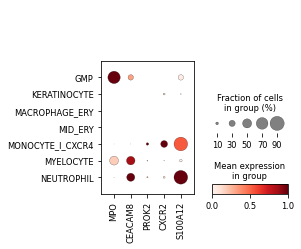

In [57]:
sc.pl.dotplot(
    neutrophil_ad,
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="suo22_pred",
    standard_scale="var",
)

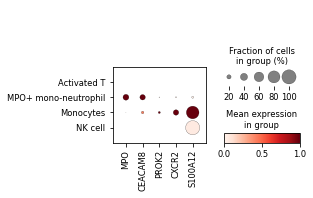

In [58]:
sc.pl.dotplot(
    neutrophil_ad,
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="elmentaite21_pred",
    standard_scale="var",
)

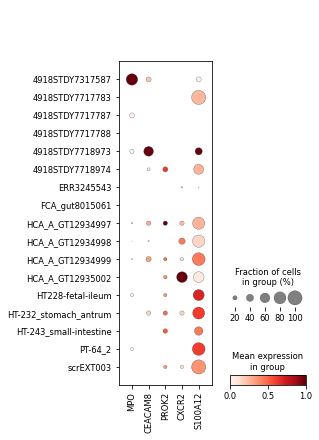

In [66]:
sc.pl.dotplot(
    neutrophil_ad,
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="sampleID",
    standard_scale="var",
)

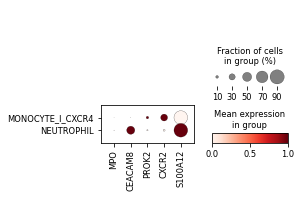

In [60]:
sc.pl.dotplot(
    neutrophil_ad[neutrophil_ad.obs.elmentaite21_pred != "MPO+ mono-neutrophil"],
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="suo22_pred",
    standard_scale="var",
)

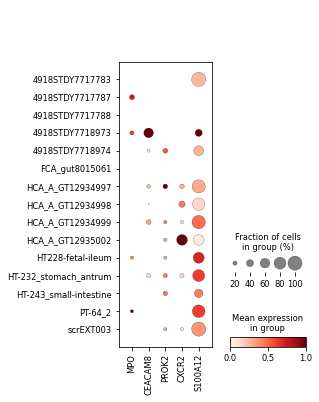

In [67]:
sc.pl.dotplot(
    neutrophil_ad[neutrophil_ad.obs.elmentaite21_pred != "MPO+ mono-neutrophil"],
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="sampleID",
    standard_scale="var",
)

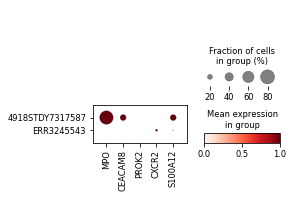

In [68]:
sc.pl.dotplot(
    neutrophil_ad[
        ~neutrophil_ad.obs.suo22_pred.isin(
            ["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"]
        )
    ],
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="sampleID",
    standard_scale="var",
)

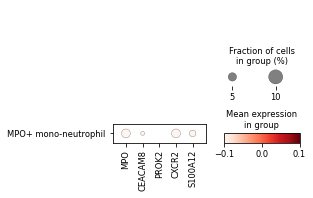

In [65]:
sc.pl.dotplot(
    neutrophil_ad[
        ~neutrophil_ad.obs.suo22_pred.isin(
            ["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"]
        )
    ],
    ["MPO", "CEACAM8", "PROK2", "CXCR2", "S100A12"],
    groupby="elmentaite21_pred",
    standard_scale="var",
)

In [70]:
pd.crosstab(
    neutrophil_ad.obs.suo22_pred.isin(["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"]),
    neutrophil_ad.obs.elmentaite21_pred == "MPO+ mono-neutrophil",
)

elmentaite21_pred,False,True
suo22_pred,,
False,0,56
True,1754,83


In [71]:
pd.crosstab(
    neutrophil_ad.obs.suo22_pred.isin(["MONOCYTE_I_CXCR4", "MYELOCYTE", "NEUTROPHIL"]),
    neutrophil_ad.obs.elmentaite21_pred.isin(["Monocytes", "MPO+ mono-neutrophil"]),
)

elmentaite21_pred,False,True
suo22_pred,,
False,0,56
True,5,1832


In [74]:
sk.clear_colors(neutrophil_ad)
neutrophil_ad.write(
    "h5ad/pooled/pooled_healthy.gene_cellbender.bad_qc_cluster_mito80.neutrophil.20221013.h5ad",
    compression="gzip",
)

In [75]:
del ad
gc.collect()

128454